<a href="https://colab.research.google.com/github/painfulpastime/MyUndergradThesis/blob/main/Thesis_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.3/258.3 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 19.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 92.8 MB/s eta 0:00:00
   ━━━

In [ ]:
# Importing necessary libraries
import numpy as np # Numerical operations on arrays and matrices
import pandas as pd # Data manipulation and analysis
import matplotlib.pyplot as plt # Plotting library for creating static, animated, and interactive visualizations
import seaborn as sns # Data visualization library based on matplotlib, provides a high-level interface for drawing attractive statistical graphics
from sklearn.model_selection import train_test_split # Utility for splitting datasets into training and testing sets
from sklearn.preprocessing import StandardScaler # Standardization of datasets
import tensorflow as tf # Open-source library for machine learning and deep learning
from tensorflow.keras.models import Sequential # Sequential model is a linear stack of layers
from tensorflow.keras.layers import Dense, LSTM, Conv1D, MaxPooling1D, Flatten, Dropout, Lambda # Various layers used in building neural network models


In [ ]:
def plot_series(x, y, format="-", start=0, end=None, title=None, xlabel=None, ylabel=None, legend=None):
    """
    Visualizes time series data

    Args:
      x (array of int) - contains values for the x-axis
      y (array of int or tuple of arrays) - contains the values for the y-axis
      format (string) - line style when plotting the graph
      start (int) - first time step to plot
      end (int) - last time step to plot
      title (string) - title of the plot
      xlabel (string) - label for the x-axis
      ylabel (string) - label for the y-axis
      legend (list of strings) - legend for the plot
    """
    plt.figure(figsize=(10, 6))

    if isinstance(y, tuple):
        for y_curr in y:
            plt.plot(x[start:end], y_curr[start:end], format)
    else:
        plt.plot(x[start:end], y[start:end], format)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if legend:
        plt.legend(legend)
    plt.title(title)
    plt.grid(True)
    plt.show()

In [ ]:
#upload dataset

from google.colab import files
uploaded = files.upload()


Saving comprehensive_data_rye_microgrid.csv to comprehensive_data_rye_microgrid.csv


In [ ]:
df=pd.read_csv('comprehensive_data_rye_microgrid.csv') #read to a dataframe
df.head() # Visualize the dataframe

,time,pv_production_kW,wind_production_kW,consumption,spot_market_price,precip_1h_mm,precip_type_idx,prob_precip_1h_p,clear_sky_rad_W,clear_sky_energy_1h_J,...,wind_speed_50m_ms,wind_dir_50m_d,t_100m_C,relative_humidity_100m_p,dew_point_100m_C,wind_speed_100m_ms,wind_dir_100m_d,rates_usd,lag_24h,lag_
0,01/01/2020 13:00,0.0,40.59,26.514689,0.28969,0.0,0,1.0,10.0,64826.0,...,8.4,246.3,8.3,60.3,1.0,10.4,247.3,0.026941,0.0,0.0
1,01/01/2020 14:00,0.0,67.86,28.326960,0.29561,0.0,0,1.0,0.0,8961.1,...,8.0,252.3,8.4,60.7,1.2,10.0,252.1,0.027492,0.0,0.0
2,01/01/2020 15:00,0.0,116.68,23.682207,0.30044,0.0,0,1.0,0.0,0.0,...,9.6,254.1,8.4,59.6,1.0,11.7,253.8,0.027941,0.0,0.0
3,01/01/2020 16:00,0.0,120.22,25.354782,0.29975,0.0,0,1.0,0.0,0.0,...,12.1,254.6,8.3,63.4,1.7,14.3,254.2,0.027877,0.0,0.0
4,01/01/2020 17:00,0.0,109.86,23.861942,0.29650,0.0,0,1.0,0.0,0.0,...,11.7,249.5,7.1,77.9,3.5,13.9,249.7,0.027574,0.0,0.0


In [ ]:
#set index the first column to date-time in the format "%m/%d/%Y %H:%M" then to index
df['time'] = pd.to_datetime(df['time'], format='%d/%m/%Y %H:%M')

df.head()

,time,pv_production_kW,wind_production_kW,consumption,spot_market_price,precip_1h_mm,precip_type_idx,prob_precip_1h_p,clear_sky_rad_W,clear_sky_energy_1h_J,...,wind_speed_50m_ms,wind_dir_50m_d,t_100m_C,relative_humidity_100m_p,dew_point_100m_C,wind_speed_100m_ms,wind_dir_100m_d,rates_usd,lag_24h,lag_
0,2020-01-01 13:00:00,0.0,40.59,26.514689,0.28969,0.0,0,1.0,10.0,64826.0,...,8.4,246.3,8.3,60.3,1.0,10.4,247.3,0.026941,0.0,0.0
1,2020-01-01 14:00:00,0.0,67.86,28.326960,0.29561,0.0,0,1.0,0.0,8961.1,...,8.0,252.3,8.4,60.7,1.2,10.0,252.1,0.027492,0.0,0.0
2,2020-01-01 15:00:00,0.0,116.68,23.682207,0.30044,0.0,0,1.0,0.0,0.0,...,9.6,254.1,8.4,59.6,1.0,11.7,253.8,0.027941,0.0,0.0
3,2020-01-01 16:00:00,0.0,120.22,25.354782,0.29975,0.0,0,1.0,0.0,0.0,...,12.1,254.6,8.3,63.4,1.7,14.3,254.2,0.027877,0.0,0.0
4,2020-01-01 17:00:00,0.0,109.86,23.861942,0.29650,0.0,0,1.0,0.0,0.0,...,11.7,249.5,7.1,77.9,3.5,13.9,249.7,0.027574,0.0,0.0


In [ ]:
# Create a new feature column for the day of the week (1 = Monday, ..., 7 = Sunday)
df['day_of_week'] = df['time'].dt.dayofweek + 1

# Create a new feature column for the time of day (1 = 1:00 AM, ..., 24 = 12:00 AM)
df['time_of_day'] = df['time'].dt.hour + 1

df.head()

,time,pv_production_kW,wind_production_kW,consumption,spot_market_price,precip_1h_mm,precip_type_idx,prob_precip_1h_p,clear_sky_rad_W,clear_sky_energy_1h_J,...,t_100m_C,relative_humidity_100m_p,dew_point_100m_C,wind_speed_100m_ms,wind_dir_100m_d,rates_usd,lag_24h,lag_,day_of_week,time_of_day
0,2020-01-01 13:00:00,0.0,40.59,26.514689,0.28969,0.0,0,1.0,10.0,64826.0,...,8.3,60.3,1.0,10.4,247.3,0.026941,0.0,0.0,3,14
1,2020-01-01 14:00:00,0.0,67.86,28.326960,0.29561,0.0,0,1.0,0.0,8961.1,...,8.4,60.7,1.2,10.0,252.1,0.027492,0.0,0.0,3,15
2,2020-01-01 15:00:00,0.0,116.68,23.682207,0.30044,0.0,0,1.0,0.0,0.0,...,8.4,59.6,1.0,11.7,253.8,0.027941,0.0,0.0,3,16
3,2020-01-01 16:00:00,0.0,120.22,25.354782,0.29975,0.0,0,1.0,0.0,0.0,...,8.3,63.4,1.7,14.3,254.2,0.027877,0.0,0.0,3,17
4,2020-01-01 17:00:00,0.0,109.86,23.861942,0.29650,0.0,0,1.0,0.0,0.0,...,7.1,77.9,3.5,13.9,249.7,0.027574,0.0,0.0,3,18


In [ ]:
df.set_index('time', inplace=True)

In [ ]:
#SELECT   COLUMNS TO USE AS FEATURES IN OUR MODEL TRAINING AND TESTING
columns_to_retain = [
    'precip_1h_mm', 'prob_precip_1h_p', 'clear_sky_rad_W',
    'diffuse_rad_W', 'direct_rad_W', 'global_rad_W',
    'sunshine_duration_1h_min', 'sun_elevation_d',
    'total_cloud_cover_p', 'temp', 'wind_speed_2m_ms',
    'lag_24h', 'lag_','time_of_day','day_of_week']


features = df[columns_to_retain]
# Split features and target
x = features.values
y = df['consumption'].values

In [ ]:
arima_columns = [
    'precip_1h_mm', 'prob_precip_1h_p', 'clear_sky_rad_W',
    'diffuse_rad_W', 'direct_rad_W', 'global_rad_W',
    'sunshine_duration_1h_min', 'sun_elevation_d',
    'total_cloud_cover_p', 'temp', 'wind_speed_2m_ms',
    'lag_24h', 'lag_','consumption','time_of_day','day_of_week']

arima_df = df[arima_columns]
arima_df.head()

,precip_1h_mm,prob_precip_1h_p,clear_sky_rad_W,diffuse_rad_W,direct_rad_W,global_rad_W,sunshine_duration_1h_min,sun_elevation_d,total_cloud_cover_p,temp,wind_speed_2m_ms,lag_24h,lag_,consumption,time_of_day,day_of_week
time,,,,,,,,,,,,,,,,
2020-01-01 13:00:00,0.0,1.0,10.0,7.4,0.3,7.7,26.0,1.346,99.0,8.3,4.1,0.0,0.0,26.514689,14,3
2020-01-01 14:00:00,0.0,1.0,0.0,0.0,0.0,0.0,16.6,-1.950,100.0,8.1,3.8,0.0,0.0,28.326960,15,3
2020-01-01 15:00:00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-6.501,100.0,8.3,4.7,0.0,0.0,23.682207,16,3
2020-01-01 16:00:00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-12.043,100.0,8.3,6.1,0.0,0.0,25.354782,17,3
2020-01-01 17:00:00,0.0,1.0,0.0,0.0,0.0,0.0,0.0,-18.288,100.0,7.0,5.9,0.0,0.0,23.861942,18,3


In [ ]:
print("\nMissing values in Rye minigrid data:")
print(arima_df.isnull().sum())


Missing values in Rye minigrid data:
precip_1h_mm                0
prob_precip_1h_p            0
clear_sky_rad_W             0
diffuse_rad_W               0
direct_rad_W                0
global_rad_W                0
sunshine_duration_1h_min    0
sun_elevation_d             0
total_cloud_cover_p         0
temp                        0
wind_speed_2m_ms            0
lag_24h                     0
lag_                        0
consumption                 0
time_of_day                 0
day_of_week                 0
dtype: int64


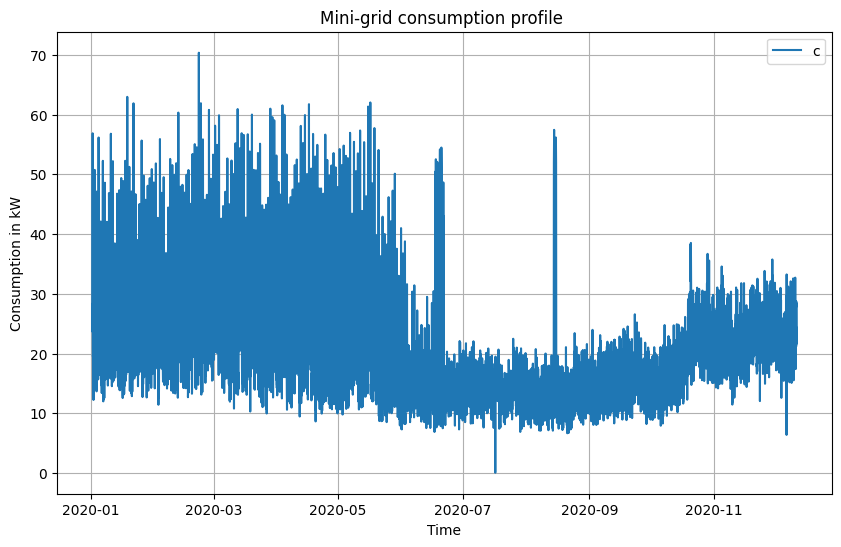

In [ ]:
# Preview the data
plot_series(df.index, y, xlabel='Time', ylabel='Consumption in kW', title='Mini-grid consumption profile ',legend='consumption')

#ARIMA FORECASTING PROCESS


IDENTIFICATION OF MODEL PARAMETERS THROUGH PACF, ACF AND DIFFERENCING

In [ ]:
# Import the Augmented Dickey-Fuller test for stationarity testing
from statsmodels.tsa.stattools import adfuller


(-4.789300903840388,
 5.700777830305987e-05,
 32,
 8247,
 {'1%': -3.4311431777100427,
  '5%': -2.8618905291606067,
  '10%': -2.566956581861126},
 49805.36000161075)

In [ ]:
def adf_test(series, title=''):
    """
    Pass in a time series and an optional title, returns an ADF report
    """
    print(f'Augmented Dickey-Fuller Test: {title}')
    result = adfuller(series.dropna(), autolag='AIC')
    labels = ['ADF Test Statistic', 'p-value', '# Lags Used', 'Number of Observations Used']
    out = pd.Series(result[0:4], index=labels)
    for key, value in result[4].items():
        out[f'Critical Value ({key})'] = value
    print(out.to_string())
    if result[1] <= 0.05:
        print("=> The series is stationary.")
    else:
        print("=> The series is non-stationary.")

# Perform ADF test on original data
adf_test(arima_df['consumption'], title='Consumption profile - Original')

Augmented Dickey-Fuller Test: Consumption profile - Original
ADF Test Statistic               -4.789301
p-value                           0.000057
# Lags Used                      32.000000
Number of Observations Used    8247.000000
Critical Value (1%)              -3.431143
Critical Value (5%)              -2.861891
Critical Value (10%)             -2.566957
=> The series is stationary.


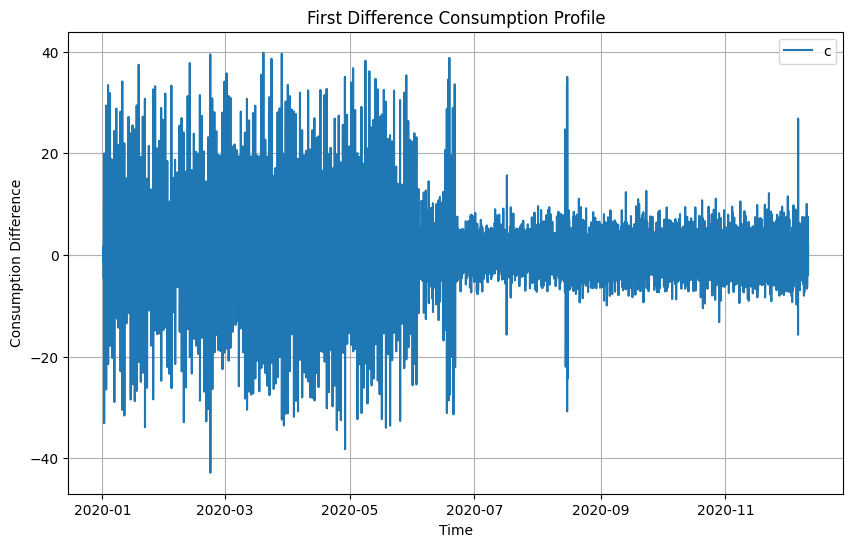

In [ ]:

# Plot the differenced data
plot_series(arima_df.index, arima_df['consumption_diff'], xlabel='Time', ylabel='Consumption Difference', title='First Difference Consumption Profile', legend='consumption_diff')


In [ ]:
# Perform the ADF test on the differenced consumption data

arima_df['consumption_diff'] = arima_df['consumption'].diff()
adf_test(arima_df['consumption_diff'], title='Consumption profile - First Difference')


<ipython-input-16-e3ae9156b409>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arima_df['consumption_diff'] = arima_df['consumption'].diff()


Augmented Dickey-Fuller Test: Consumption profile - First Difference
ADF Test Statistic              -27.622985
p-value                           0.000000
# Lags Used                      29.000000
Number of Observations Used    8249.000000
Critical Value (1%)              -3.431143
Critical Value (5%)              -2.861890
Critical Value (10%)             -2.566957
=> The series is stationary.


In [ ]:
print("\nSummary statistics for the original data:")
print(arima_df['consumption'].describe())
print("\nSummary statistics for the differenced data:")
print(arima_df['consumption_diff'].describe())


Summary statistics for the original data:
count    8280.000000
mean       19.044574
std         7.549438
min         0.048396
25%        14.238174
50%        17.835309
75%        21.999435
max        70.366622
Name: consumption, dtype: float64

Summary statistics for the differenced data:
count    8279.000000
mean       -0.000320
std         6.336127
min       -42.857900
25%        -2.465435
50%        -0.212856
75%         2.178461
max        39.812711
Name: consumption_diff, dtype: float64


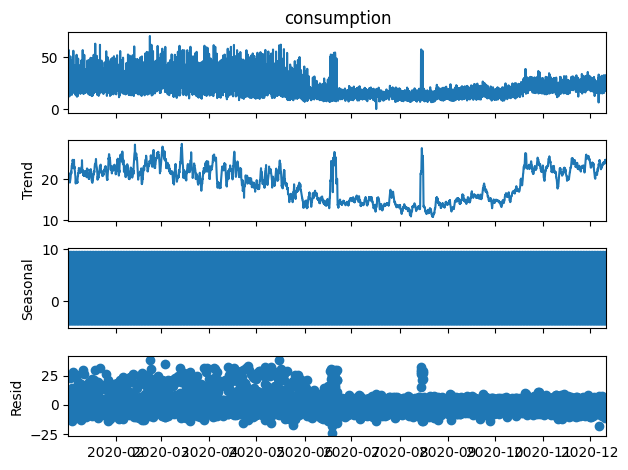

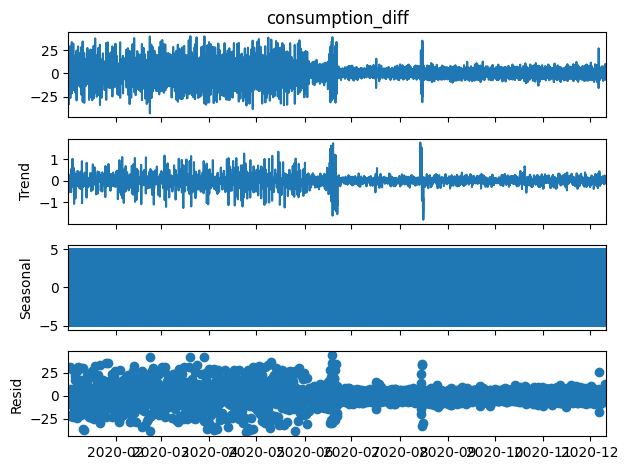

In [ ]:
# plot seasonal decomposition of both arima_df.consumption and arima_df.consumption_diff

from statsmodels.tsa.seasonal import seasonal_decompose

# Perform seasonal decomposition on original data
decomposition = seasonal_decompose(arima_df['consumption'], model='additive')
decomposition.plot()
plt.show()

# Perform seasonal decomposition on differenced data
decomposition_diff = seasonal_decompose(arima_df['consumption_diff'].dropna(), model='additive')
decomposition_diff.plot()
plt.show()


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

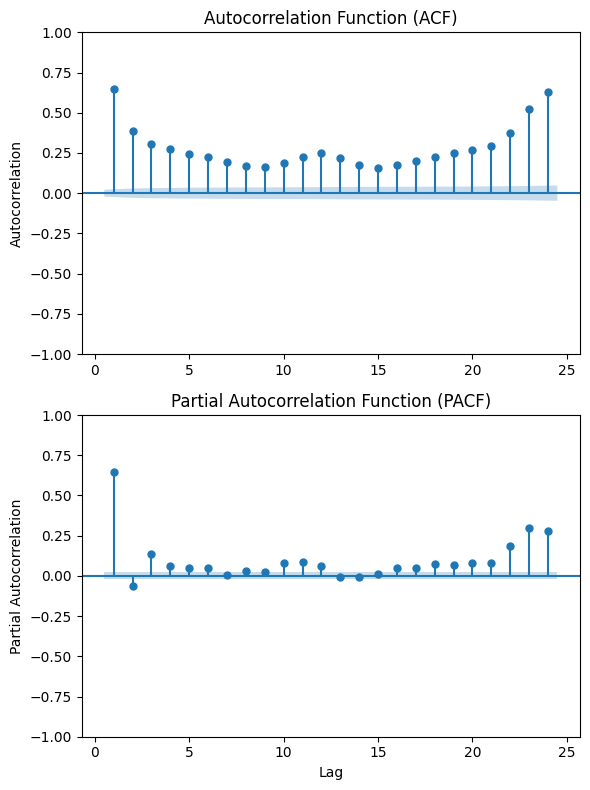

In [ ]:
# Plot ACF and PACF for the original Mini-grid consumption data
plt.figure(figsize=(6, 8))
plt.subplot(211)
plot_acf(arima_df['consumption'], ax=plt.gca(), zero=False, lags=24)
plt.title('Autocorrelation Function (ACF)')
plt.ylabel('Autocorrelation')
plt.subplot(212)
plot_pacf(arima_df['consumption'], ax=plt.gca(), zero=False, lags=24)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.tight_layout()
plt.show()

In [ ]:
# Import ARIMA time series library
from pycaret.time_series import *

In [ ]:
# Create an Experiment instance
exp_arima= TSForecastingExperiment()
exp_arima.setup(data = arima_df, target='consumption' ,  fh = 400, coverage=0.95,numeric_imputation_exogenous='mean')

,Description,Value
0,session_id,5012
1,Target,consumption
2,Approach,Univariate
3,Exogenous Variables,Present
4,Original data shape,"(8280, 17)"
5,Transformed data shape,"(8280, 17)"
6,Transformed train set shape,"(7880, 17)"
7,Transformed test set shape,"(400, 17)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


In [ ]:
#Check the general statistics
exp_arima.check_stats()

,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,8280.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,19.044574
3,Summary,Statistics,Transformed,Median,,17.835309
4,Summary,Statistics,Transformed,Standard Deviation,,7.549438
5,Summary,Statistics,Transformed,Variance,,56.994013
6,Summary,Statistics,Transformed,Kurtosis,,7.246786
7,Summary,Statistics,Transformed,Skewness,,2.126836
8,Summary,Statistics,Transformed,# Distinct Values,,8277.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",19398.295725


In [ ]:
#Plot the train-test split
exp_arima.plot_model(plot='train_test_split')

BUILD AND EVALUATE THE MODELS

AR(1)

In [ ]:
#Build the AR1 model
ar1 = exp_arima.create_model('arima', order = (1,0,0), seasonal_order=(0,0,0,24), with_intercept=True, cross_validation=False)


,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
Test,1.1204,0.8049,4.4919,5.3169,0.1856,0.2074,-0.6377


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

MA(1)

In [ ]:
#Build the MA1 model
ma1 = exp_arima.create_model('arima', order = (0,0,1), seasonal_order=(0,0,0,24), with_intercept= True, cross_validation=False)

,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
Test,0.8282,0.6306,3.3204,4.1654,0.1422,0.1480,-0.0052


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

ARIMA(1,1,1)- SELECTED MODEL

In [ ]:
#Build the ARIMA111 model
arima111= exp_arima.create_model('arima', order = (1,1,1), seasonal_order=(0,0,0,24) , with_intercept= True, cross_validation=False)

,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
Test,1.9647,1.3088,7.8764,8.6455,0.3708,0.2979,-3.3302


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
# Check the diagnostics
exp_arima.plot_model(arima111, plot='diagnostics')

In [ ]:
#Check AR1 diagnostics
exp_arima.plot_model(ar1, plot='diagnostics')

In [ ]:
#Check MA1 diagnostics
exp_arima.plot_model(ma1, plot='diagnostics')

In [ ]:
# Build the SARIMA models
sarima212201= exp_arima.create_model('arima', order = (2,1,2), seasonal_order=(2,0,1,24) , with_intercept= True, cross_validation=False)

,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
Test,0.6531,0.5056,2.6183,3.3400,0.1152,0.1140,0.3537


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
# Check SARIMA diagnostics
exp_arima.plot_model(sarima212201, plot='diagnostics')

In [ ]:
#Plot the residuals for SARIMA model
exp_arima.plot_model(sarima212201, plot='residuals')

In [ ]:
# let's test the stationarity of the residuals for the ARIMA(1,1,1) model:
exp_arima.check_stats(arima111, test = 'adf')

,Test,Test Name,Data,Property,Setting,Value
0,Stationarity,ADF,Residual,Stationarity,{'alpha': 0.05},True
1,Stationarity,ADF,Residual,p-value,{'alpha': 0.05},0.0
2,Stationarity,ADF,Residual,Test Statistic,{'alpha': 0.05},-36.046574
3,Stationarity,ADF,Residual,Critical Value 1%,{'alpha': 0.05},-3.431183
4,Stationarity,ADF,Residual,Critical Value 5%,{'alpha': 0.05},-2.861908
5,Stationarity,ADF,Residual,Critical Value 10%,{'alpha': 0.05},-2.566966


SARIMA(2,1,2)(2,0,1)

ARIMAX(1,1,1) with exogenous variables

In [ ]:
# Build the ARIMAX model

import statsmodels.api as sm

from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error # Import Error metrics

y = arima_df['consumption']
exog = arima_df[['precip_1h_mm', 'prob_precip_1h_p', 'clear_sky_rad_W',
                 'diffuse_rad_W', 'direct_rad_W', 'global_rad_W',
                 'sunshine_duration_1h_min', 'sun_elevation_d',
                 'total_cloud_cover_p', 'temp', 'wind_speed_2m_ms',
                 'lag_24h', 'lag_']] # exogenous data

# Split the data into training and testing sets
train_size = int(7880)
y_train, y_test = y[:train_size], y[train_size:]
exog_train, exog_test = exog[:train_size], exog[train_size:]

# Fit the ARIMAX model
model_x = sm.tsa.ARIMA(y_train, order=(1, 1, 1), exog=exog_train)
results_x = model_x.fit()

# Make predictions
predictions = results_x.predict(start=len(y_train), end=len(y_train) + len(y_test) - 1, exog=exog_test)

# Calculate MAE, MAPE, and RMSE
mae = mean_absolute_error(y_test, predictions)
mape = mean_absolute_percentage_error(y_test, predictions)
rmse = np.sqrt(mean_squared_error(y_test, predictions))

# Print the results
print(f'MAE: {mae}')
print(f'MAPE: {mape}')
print(f'RMSE: {rmse}')


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


MAE: 2.6376031411424448
MAPE: 0.12285362598887298
RMSE: 3.4043877944815124


In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf # import plot_acf and plot_pacf


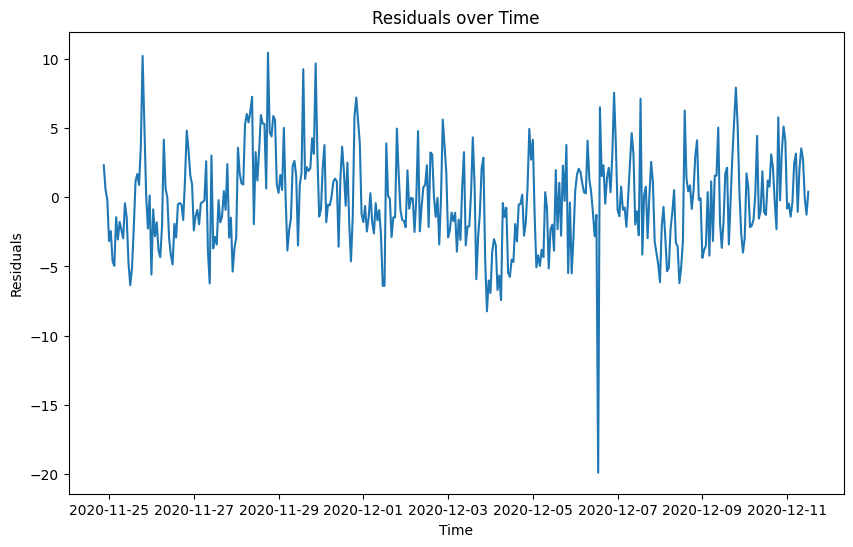

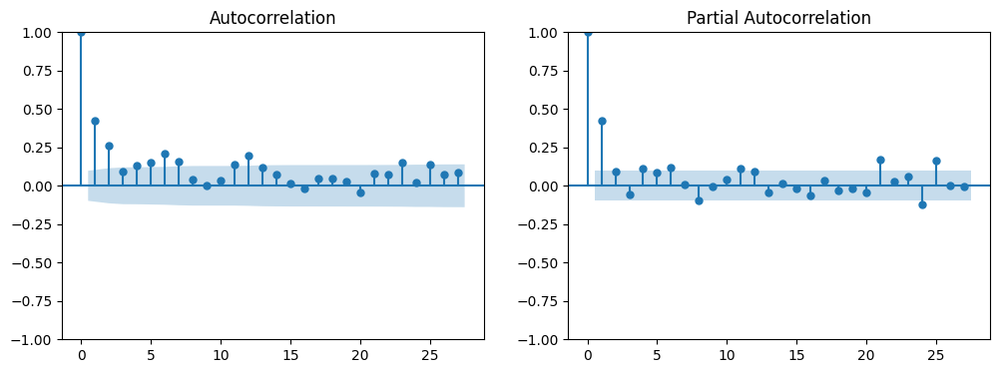

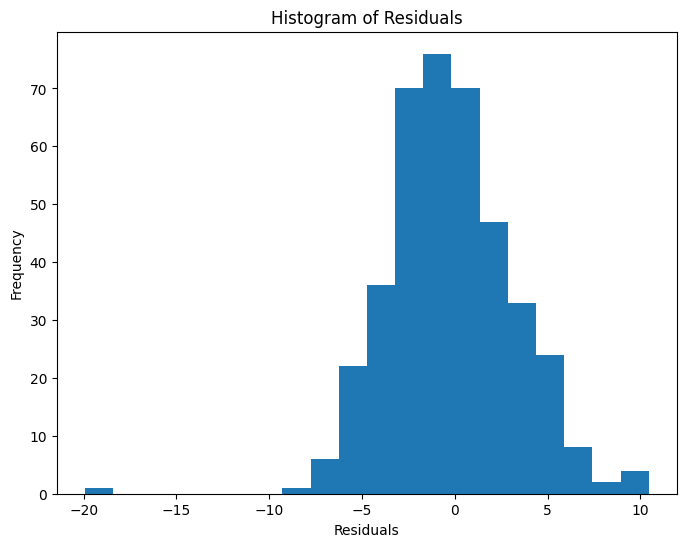

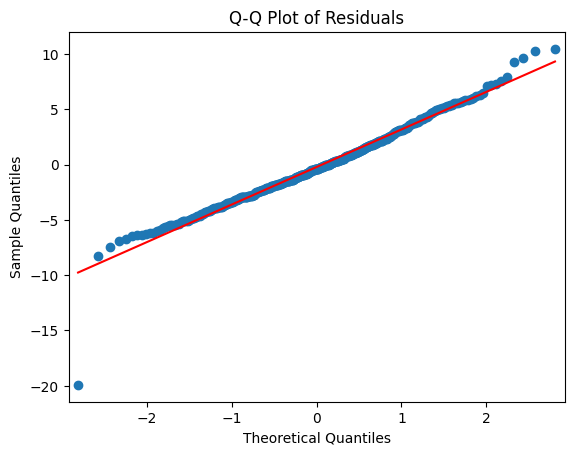

In [ ]:

# ARIMAX Residual analysis
residuals = y_test - predictions

# Plot residuals over time
plt.figure(figsize=(10, 6))
plt.plot(residuals)
plt.title('Residuals over Time')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.show()

# Plot ACF and PACF of residuals
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(residuals, ax=axes[0])
plot_pacf(residuals, ax=axes[1])
plt.show()

# Histogram of residuals
plt.figure(figsize=(8, 6))
plt.hist(residuals, bins=20)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Q-Q plot of residuals
sm.qqplot(residuals, line='s')
plt.title('Q-Q Plot of Residuals')
plt.show()


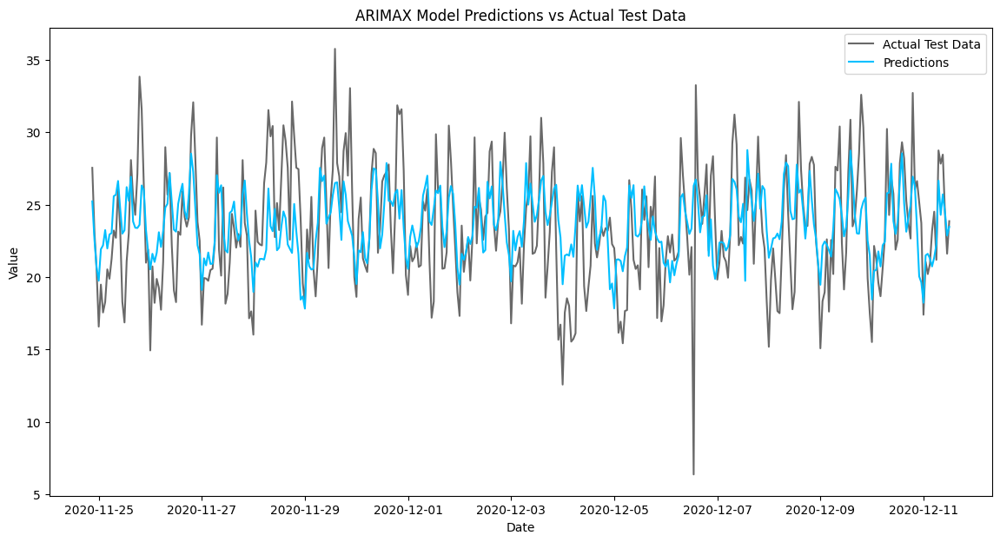

In [ ]:
# Plot the results
plt.figure(figsize=(14, 7))

# Plot actual test data
plt.plot(y_test.index, y_test, label='Actual Test Data', color='dimgray')

# Plot predictions
plt.plot(y_test.index, predictions, label='Predictions', color='deepskyblue')

# Add labels, legend, and title
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('ARIMAX Model Predictions vs Actual Test Data')
plt.legend()

plt.show()

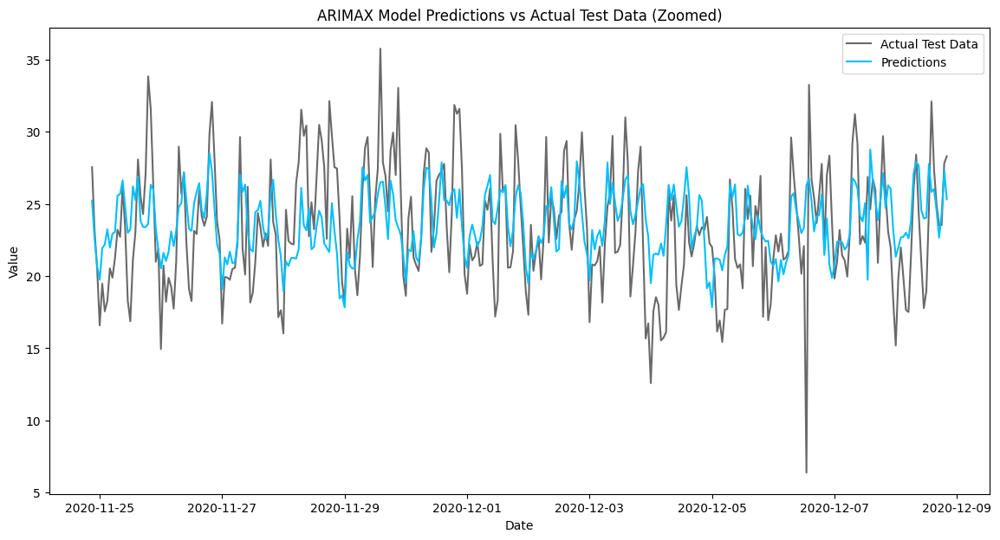

In [ ]:

# Plot the results (zoomed in)
plt.figure(figsize=(14, 7))

# Plot actual test data (zoomed in)
plt.plot(y_test.index[:336], y_test[:336], label='Actual Test Data', color='dimgray')

# Plot predictions (zoomed in)
plt.plot(y_test.index[:336], predictions[:336], label='Predictions', color='deepskyblue')

# Add labels, legend, and title
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('ARIMAX Model Predictions vs Actual Test Data (Zoomed)')
plt.legend()

plt.show()


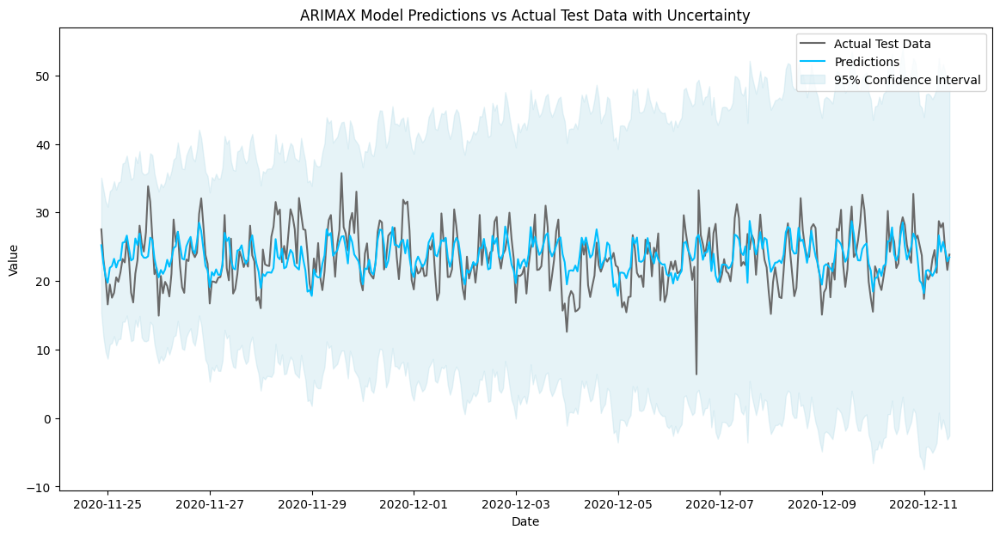

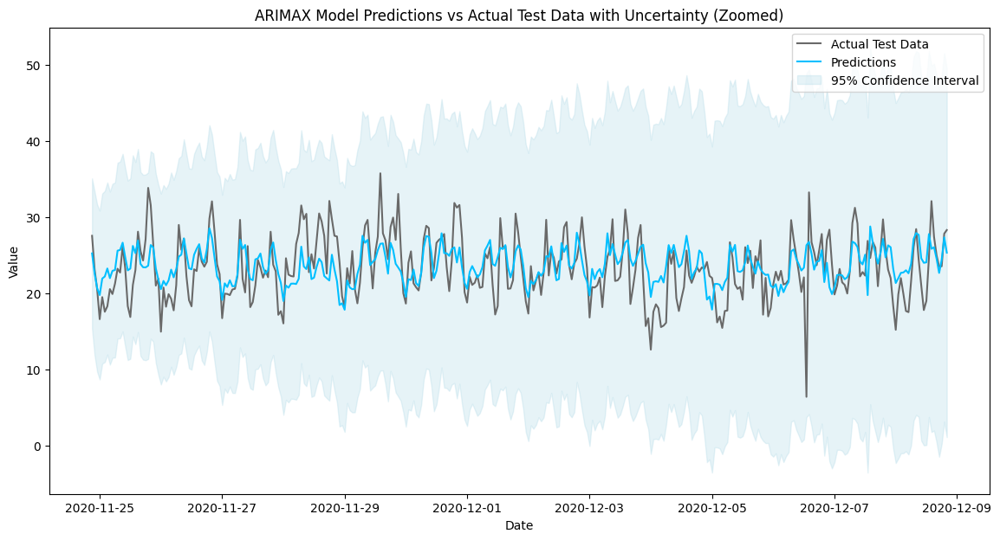

In [ ]:


import matplotlib.pyplot as plt
# Get confidence intervals for predictions
forecast_conf_int = results_x.get_forecast(steps=len(y_test), exog=exog_test).conf_int(alpha=0.05)

# Plot the results
plt.figure(figsize=(14, 7))

# Plot actual test data
plt.plot(y_test.index, y_test, label='Actual Test Data', color='dimgray')

# Plot predictions
plt.plot(y_test.index, predictions, label='Predictions', color='deepskyblue')

# Plot confidence intervals
plt.fill_between(y_test.index, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1],
                 color='lightblue', alpha=0.3, label='95% Confidence Interval')

# Add labels, legend, and title
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('ARIMAX Model Predictions vs Actual Test Data with Uncertainty')
plt.legend()

plt.show()

# Plot the results (zoomed in)
plt.figure(figsize=(14, 7))

# Plot actual test data (zoomed in)
plt.plot(y_test.index[:336], y_test[:336], label='Actual Test Data', color='dimgray')

# Plot predictions (zoomed in)
plt.plot(y_test.index[:336], predictions[:336], label='Predictions', color='deepskyblue')

# Plot confidence intervals (zoomed in)
plt.fill_between(y_test.index[:336], forecast_conf_int.iloc[:336, 0], forecast_conf_int.iloc[:336, 1],
                 color='lightblue', alpha=0.3, label='95% Confidence Interval')

# Add labels, legend, and title
plt.xlabel('Date')
plt.ylabel('Value')
plt.title('ARIMAX Model Predictions vs Actual Test Data with Uncertainty (Zoomed)')
plt.legend()

plt.show()


Compare the models

In [ ]:
my_models = [ ar1, ma1, arima111, sarima212201]
my_model_lables = [ 'AR(1)', 'MA(1)', 'ARIMA(1,1,1)', 'SARIMA(2,1,2)(2,0,1,24)']
my_models

[ARIMA(seasonal_order=(0, 0, 0, 24)),
 ARIMA(order=(0, 0, 1), seasonal_order=(0, 0, 0, 24)),
 ARIMA(order=(1, 1, 1), seasonal_order=(0, 0, 0, 24)),
 ARIMA(order=(2, 1, 2), seasonal_order=(2, 0, 1, 24))]

In [ ]:
exp.compare_models(my_models, cross_validation=False)

#### Plotting the models

In [ ]:
exp_arima.plot_model(ar1, plot='forecast', data_kwargs={'fh':400,  'labels':['AR(1)']})

In [ ]:
exp_arima.plot_model(ma1, plot='forecast', data_kwargs={'fh':400, 'labels':['MA(1)']})

In [ ]:
exp_arima.plot_model(arima111, plot='forecast', data_kwargs={'fh':400,'labels':['ARIMA(1,1,1']})

In [ ]:
exp_arima.plot_model(sarima212201  , plot='forecast', data_kwargs={'fh':400, 'labels':['SARIMA(2,1,2)(2,0,1,24)']})

In [ ]:
exp_arima.plot_model(my_models, plot='forecast', data_kwargs={'fh':400, 'labels':my_model_lables})

#INTELLIGENT MODELS


In [ ]:
# Train-test split
train_size = 7580
X_train, X_test = x[:train_size], x[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Reshape for LSTM and CNN
X_train_lstm_cnn = X_train.reshape((X_train.shape[0], X_train.shape[1], 1))
X_test_lstm_cnn = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

In [ ]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

#print(X_test[:2])
#print(y_train[:2])
#print(y_test[:2])

(7580, 15)
(700, 15)
(7580,)
(700,)


In [ ]:


# LSTM Model Architecture
model_lstm = Sequential()  #Model set-up
model_lstm.add(LSTM(64, input_shape=(X_train_lstm_cnn.shape[1], X_train_lstm_cnn.shape[2]), return_sequences=True)) #Input layer
model_lstm.add(LSTM(32))  #Hidden Layer
model_lstm.add(Dense(1))  #OUtput layer

model_lstm.compile(optimizer='adam', loss='mse')  #Model loss function and gradient descent algorithm

model_lstm.fit(X_train_lstm_cnn, y_train, epochs=50, batch_size=32, validation_split=0.2)  #Model training


Epoch 1/50
190/190 [==============================] - 10s 28ms/step - loss: 183.4131 - val_loss: 66.2816
Epoch 2/50
190/190 [==============================] - 3s 16ms/step - loss: 87.6978 - val_loss: 33.5100
Epoch 3/50
190/190 [==============================] - 3s 17ms/step - loss: 70.1033 - val_loss: 27.7980
Epoch 4/50
190/190 [==============================] - 4s 23ms/step - loss: 67.2622 - val_loss: 27.4032
Epoch 5/50
190/190 [==============================] - 3s 17ms/step - loss: 66.9994 - val_loss: 27.4385
Epoch 6/50
190/190 [==============================] - 3s 17ms/step - loss: 66.9965 - val_loss: 27.4459
Epoch 7/50
190/190 [==============================] - 3s 16ms/step - loss: 66.9917 - val_loss: 27.4348
Epoch 8/50
190/190 [==============================] - 4s 22ms/step - loss: 66.9880 - val_loss: 27.4530
Epoch 9/50
190/190 [==============================] - 3s 16ms/step - loss: 67.0002 - val_loss: 27.5127
Epoch 10/50
190/190 [==============================] - 3s 17ms/step - l

In [ ]:
lstm_predictions = model_lstm.predict(X_test_lstm_cnn)

22/22 [==============================] - 1s 6ms/step


In [ ]:
def plot_predictions(time_index,actual, predictions, title, xlabel='Time', ylabel='Consumption', label='Predictions'):
    plt.figure(figsize=(14, 7))
    plt.plot(time_index, actual, label='Actual', color='blue')
    plt.plot(time_index, predictions, label=label, color='red', linestyle='dashed')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

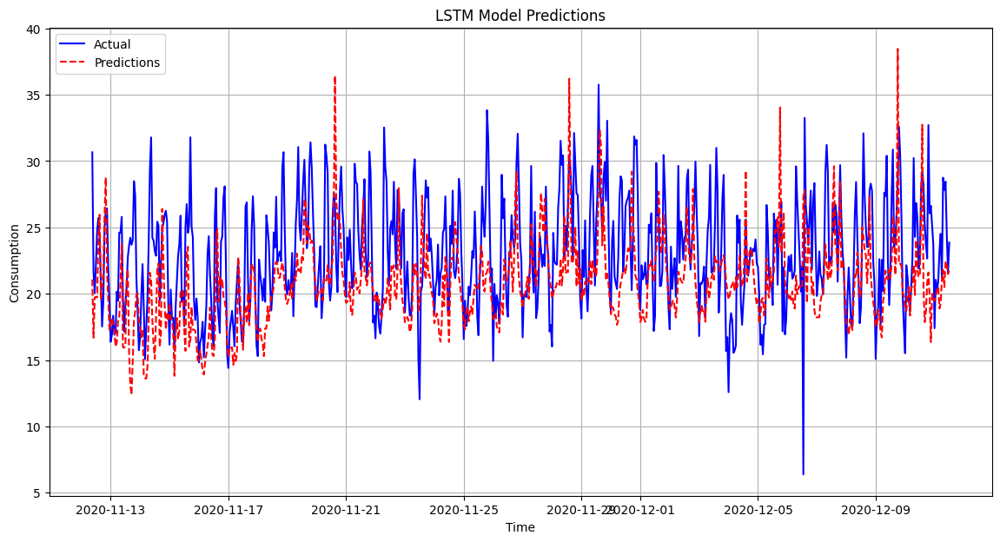

In [ ]:

# Plotting for LSTM
plot_predictions(df.index[train_size:],y_test, lstm_predictions, 'LSTM Model Predictions')


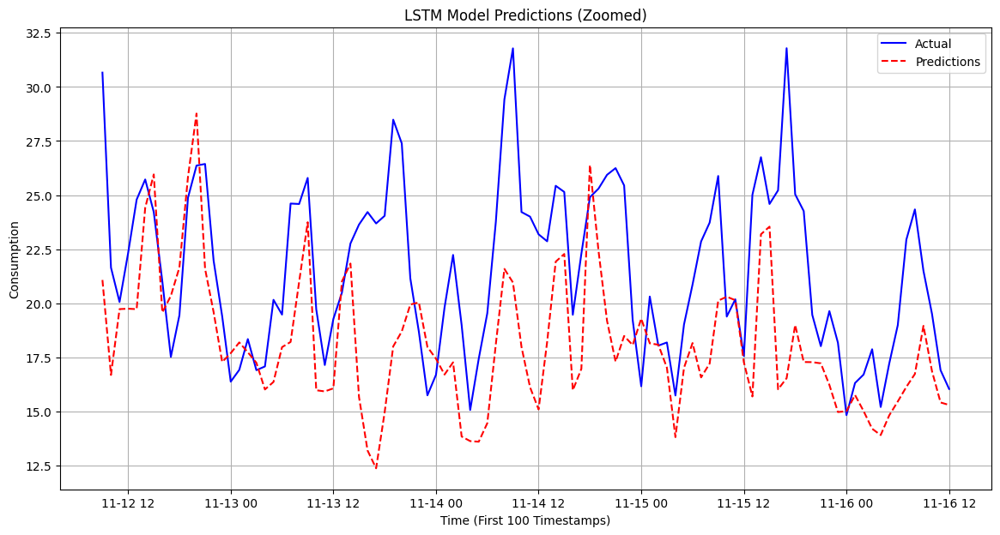

In [ ]:


# Plotting for LSTM (zoomed in)
plot_predictions(df.index[train_size:train_size+100],y_test[:100], lstm_predictions[:100], 'LSTM Model Predictions (Zoomed)', xlabel='Time (First 100 Timestamps)')


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# MLP Model Architecture
mlp_model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train.shape[1],)), #Input layer
    Dense(32, activation='relu'),  #Hidden Layer
    Dense(1)  #Output layer
])
mlp_model.compile(optimizer='adam', loss='mse') #Model Loss function and gradient descent algrithm
mlp_model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2) #Hyperparameter fitting and model training

Epoch 1/50
190/190 [==============================] - 1s 3ms/step - loss: 77.6255 - val_loss: 13.0722
Epoch 2/50
190/190 [==============================] - 0s 2ms/step - loss: 44.6174 - val_loss: 15.5018
Epoch 3/50
190/190 [==============================] - 0s 2ms/step - loss: 41.8962 - val_loss: 12.6486
Epoch 4/50
190/190 [==============================] - 0s 2ms/step - loss: 41.0396 - val_loss: 13.9607
Epoch 5/50
190/190 [==============================] - 0s 2ms/step - loss: 43.7225 - val_loss: 12.8451
Epoch 6/50
190/190 [==============================] - 0s 2ms/step - loss: 39.1074 - val_loss: 14.2050
Epoch 7/50
190/190 [==============================] - 1s 4ms/step - loss: 41.3005 - val_loss: 14.8478
Epoch 8/50
190/190 [==============================] - 1s 4ms/step - loss: 39.4015 - val_loss: 13.2460
Epoch 9/50
190/190 [==============================] - 1s 4ms/step - loss: 37.4522 - val_loss: 13.7587
Epoch 10/50
190/190 [==============================] - 1s 4ms/step - loss: 37.8223

22/22 [==============================] - 0s 2ms/step


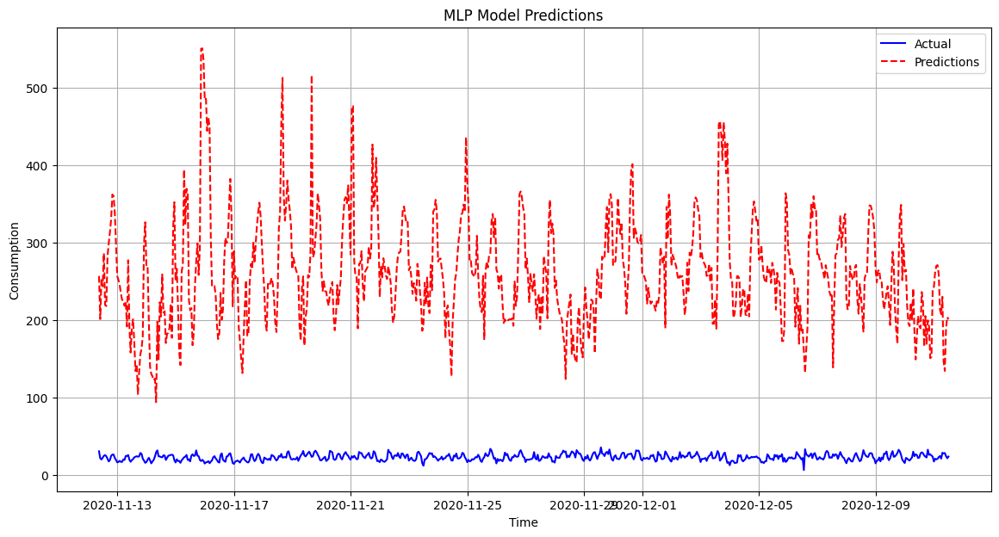

In [ ]:
mlp_predictions = mlp_model.predict(X_test).flatten()

# Plotting for MLP
plot_predictions(df.index[train_size:],y_test, mlp_predictions, 'MLP Model Predictions')

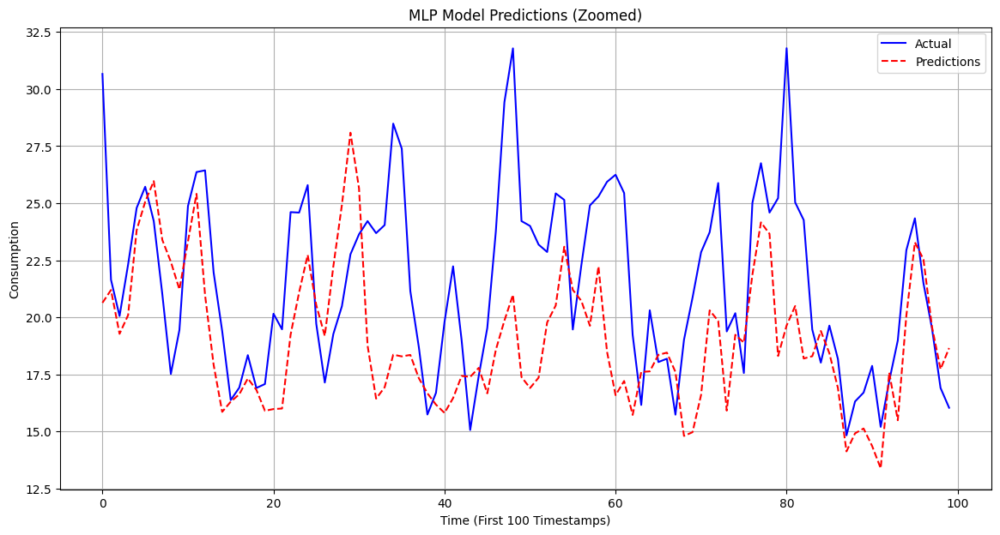

In [ ]:

# Plotting for MLP (zoomed in)
plot_predictions(df.index[train_size:train_size+100],y_test[:100], mlp_predictions[:100], 'MLP Model Predictions (Zoomed)', xlabel='Time (First 100 Timestamps)')


In [ ]:
# CNN Model Architecture
cnn_model = Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train_lstm_cnn.shape[1], 1)), # Input layer
    MaxPooling1D(pool_size=2),
    Conv1D(32, kernel_size=3, activation='relu'), #Hidden layer
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(1) #Output layer
])

cnn_model.compile(optimizer='adam', loss='mse') #Model Loss function and gradient descent algrithm
cnn_model.fit(X_train_lstm_cnn, y_train, epochs=50, batch_size=32, validation_split=0.2) #Hyperperameter and model


Epoch 1/50
190/190 [==============================] - 2s 4ms/step - loss: 129.1454 - val_loss: 31.3697
Epoch 2/50
190/190 [==============================] - 1s 4ms/step - loss: 50.2374 - val_loss: 27.0798
Epoch 3/50
190/190 [==============================] - 1s 6ms/step - loss: 45.8739 - val_loss: 25.0661
Epoch 4/50
190/190 [==============================] - 1s 6ms/step - loss: 43.1569 - val_loss: 21.1803
Epoch 5/50
190/190 [==============================] - 1s 6ms/step - loss: 41.2706 - val_loss: 20.8216
Epoch 6/50
190/190 [==============================] - 1s 4ms/step - loss: 40.1379 - val_loss: 21.0755
Epoch 7/50
190/190 [==============================] - 1s 4ms/step - loss: 39.3122 - val_loss: 26.1412
Epoch 8/50
190/190 [==============================] - 1s 4ms/step - loss: 39.0697 - val_loss: 17.9173
Epoch 9/50
190/190 [==============================] - 1s 4ms/step - loss: 38.5077 - val_loss: 19.5897
Epoch 10/50
190/190 [==============================] - 1s 3ms/step - loss: 38.527

22/22 [==============================] - 0s 2ms/step


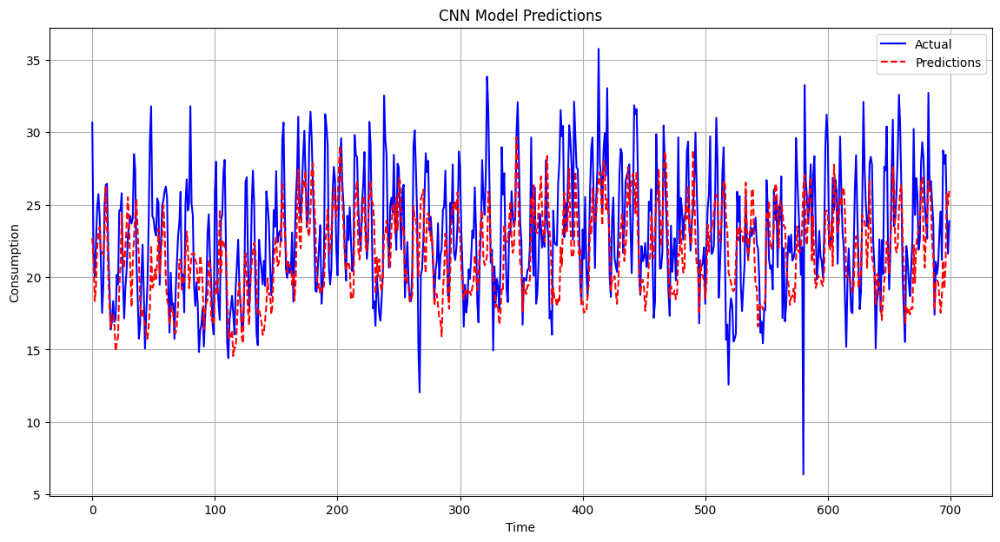

In [ ]:
cnn_predictions = cnn_model.predict(X_test_lstm_cnn).flatten()

# Plotting for CNN
plot_predictions(df.index[train_size:],y_test, cnn_predictions, 'CNN Model Predictions')

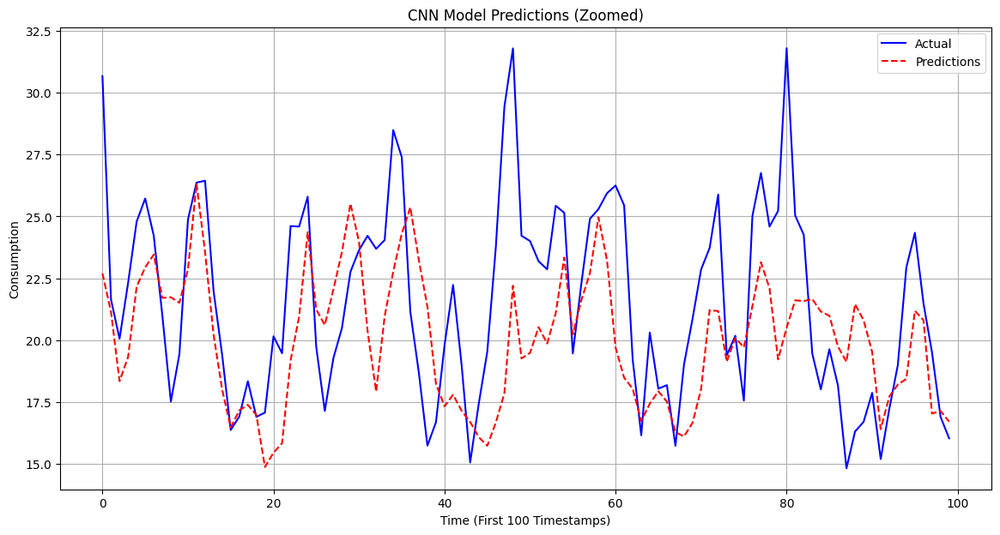

In [ ]:

# Plotting for CNN (zoomed in)
plot_predictions(df.index[train_size:train_size+100],y_test[:100], cnn_predictions[:100], 'CNN Model Predictions (Zoomed)', xlabel='Time (First 100 Timestamps)')


In [ ]:
# Combined CNN + LSTM Model
combined_model = Sequential([
    Conv1D(64, kernel_size=3, activation='relu', input_shape=(X_train_lstm_cnn.shape[1], 1)),
    MaxPooling1D(pool_size=2),
    LSTM(64, return_sequences=True),
    LSTM(32),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(1)
])
combined_model.compile(optimizer='adam', loss='mse')

In [ ]:
combined_model.fit(X_train_lstm_cnn, y_train, epochs=50, batch_size=32, validation_split=0.2)


Epoch 1/50
190/190 [==============================] - 9s 17ms/step - loss: 139.4556 - val_loss: 27.5537
Epoch 2/50
190/190 [==============================] - 2s 12ms/step - loss: 67.0447 - val_loss: 27.6267
Epoch 3/50
190/190 [==============================] - 2s 13ms/step - loss: 67.0479 - val_loss: 27.6940
Epoch 4/50
190/190 [==============================] - 3s 17ms/step - loss: 66.7176 - val_loss: 25.4691
Epoch 5/50
190/190 [==============================] - 3s 15ms/step - loss: 49.9586 - val_loss: 11.9821
Epoch 6/50
190/190 [==============================] - 2s 12ms/step - loss: 40.5864 - val_loss: 12.0974
Epoch 7/50
190/190 [==============================] - 2s 13ms/step - loss: 38.7737 - val_loss: 10.8772
Epoch 8/50
190/190 [==============================] - 2s 12ms/step - loss: 38.2368 - val_loss: 11.3148
Epoch 9/50
190/190 [==============================] - 3s 13ms/step - loss: 37.6593 - val_loss: 12.3772
Epoch 10/50
190/190 [==============================] - 3s 16ms/step - lo

22/22 [==============================] - 1s 4ms/step


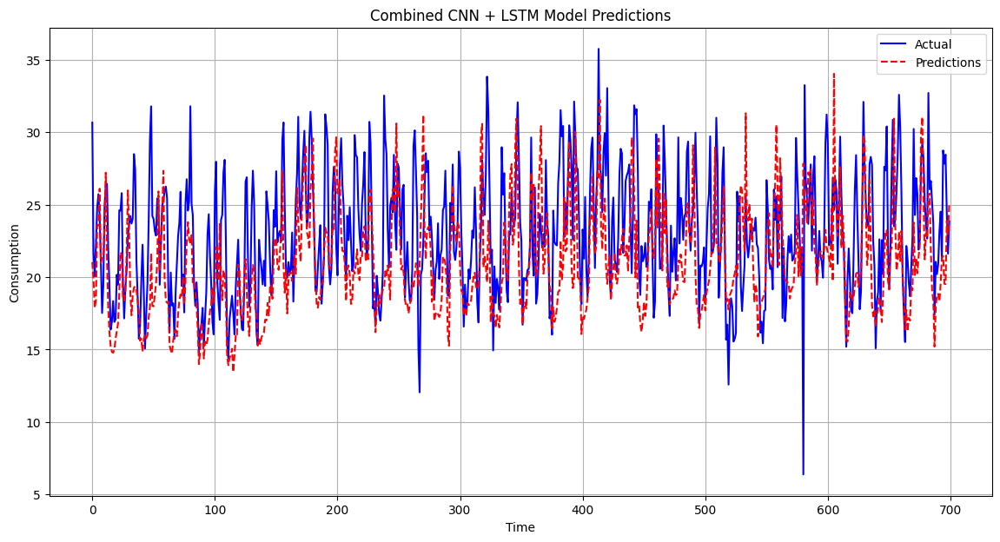

In [ ]:
combined_predictions = combined_model.predict(X_test_lstm_cnn).flatten()

# Plotting for Combined Model
plot_predictions(df.index[train_size:],y_test, combined_predictions, 'Combined CNN + LSTM Model Predictions')

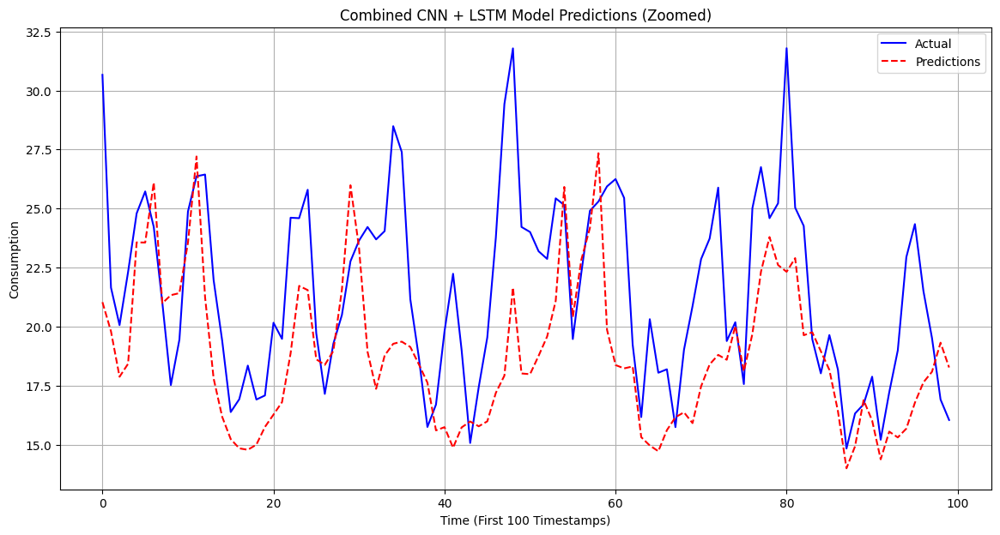

In [ ]:

# Plotting for Combined Model (zoomed in)
plot_predictions(df.index[train_size:train_size+100],y_test[:100], combined_predictions[:100], 'Combined CNN + LSTM Model Predictions (Zoomed)', xlabel='Time (First 100 Timestamps)')


In [ ]:
!pip install catboost
from catboost import CatBoostRegressor

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 2.7 MB/s eta 0:00:00


In [ ]:
model_cb = CatBoostRegressor(iterations=1000, learning_rate=0.1, depth=6, loss_function='MAE', verbose=200)

# Train the model
model_cb.fit(X_train, y_train, eval_set=(X_test, y_test), early_stopping_rounds=100)


0:	learn: 7.3992111	test: 5.6409486	best: 5.6409486 (0)	total: 52.3ms	remaining: 52.3s
Stopped by overfitting detector  (100 iterations wait)

bestTest = 3.263079771
bestIteration = 45

Shrink model to first 46 iterations.


In [ ]:
y_pred_cb = model_cb.predict(X_test)


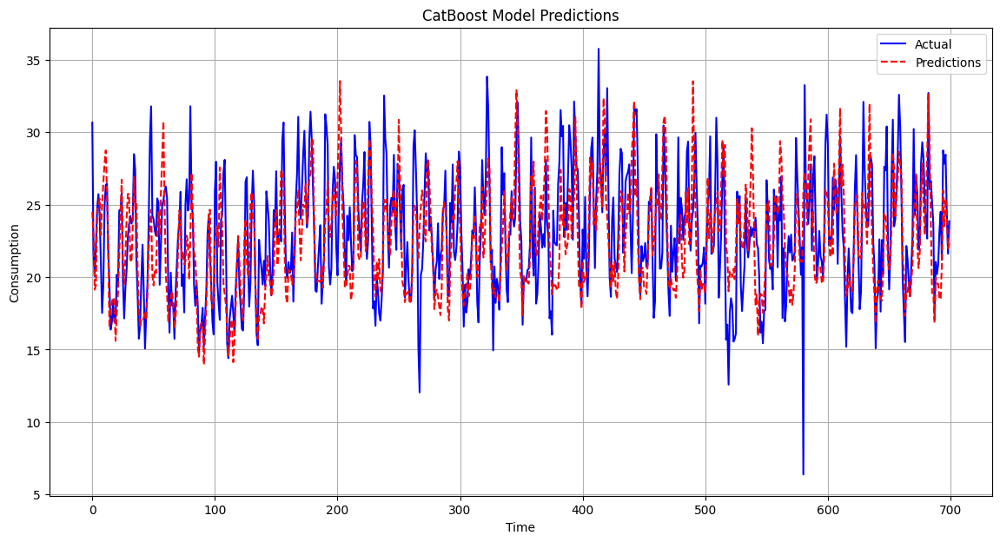

In [ ]:

# Plot the predictions against the actual values
plot_predictions(df.index[train_size:],y_test, y_pred_cb, 'CatBoost Model Predictions')

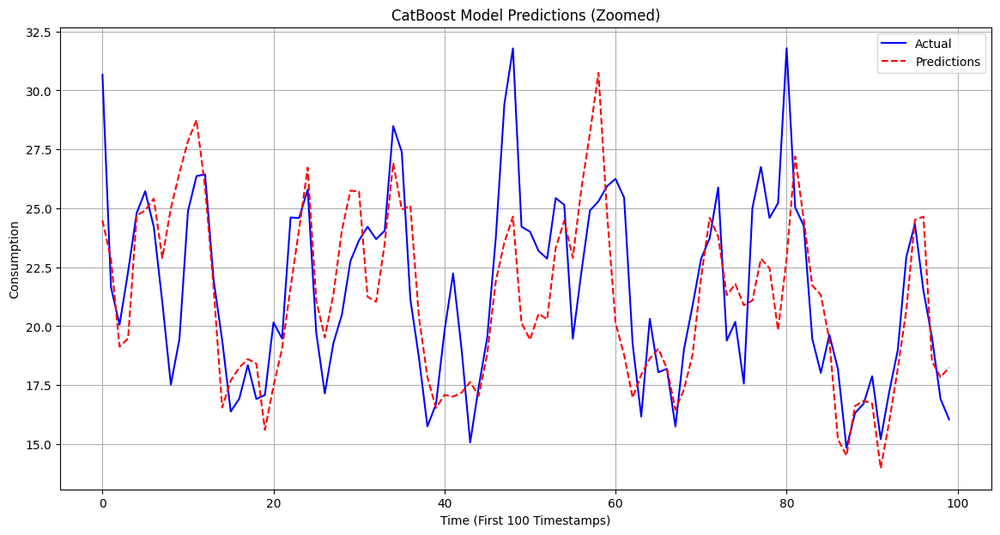

In [ ]:


# Plotting for CatBoost (zoomed in)
plot_predictions(df.index[train_size:train_size+100],y_test[:100], y_pred_cb[:100], 'CatBoost Model Predictions (Zoomed)', xlabel='Time (First 100 Timestamps)')

[0]	validation_0-rmse:5.65243
[1]	validation_0-rmse:5.32115
[2]	validation_0-rmse:5.03567
[3]	validation_0-rmse:4.79745
[4]	validation_0-rmse:4.58640
[5]	validation_0-rmse:4.40834
[6]	validation_0-rmse:4.24668
[7]	validation_0-rmse:4.13058
[8]	validation_0-rmse:4.01655
[9]	validation_0-rmse:3.92526
[10]	validation_0-rmse:3.82966
[11]	validation_0-rmse:3.77105
[12]	validation_0-rmse:3.71401
[13]	validation_0-rmse:3.67078
[14]	validation_0-rmse:3.62089
[15]	validation_0-rmse:3.57096
[16]	validation_0-rmse:3.53474
[17]	validation_0-rmse:3.50142
[18]	validation_0-rmse:3.47631
[19]	validation_0-rmse:3.45820
[20]	validation_0-rmse:3.43259
[21]	validation_0-rmse:3.42211
[22]	validation_0-rmse:3.41527
[23]	validation_0-rmse:3.40292
[24]	validation_0-rmse:3.39811
[25]	validation_0-rmse:3.38357
[26]	validation_0-rmse:3.38288
[27]	validation_0-rmse:3.38243
[28]	validation_0-rmse:3.38008
[29]	validation_0-rmse:3.37961
[30]	validation_0-rmse:3.37766
[31]	validation_0-rmse:3.38107
[32]	validation_0-

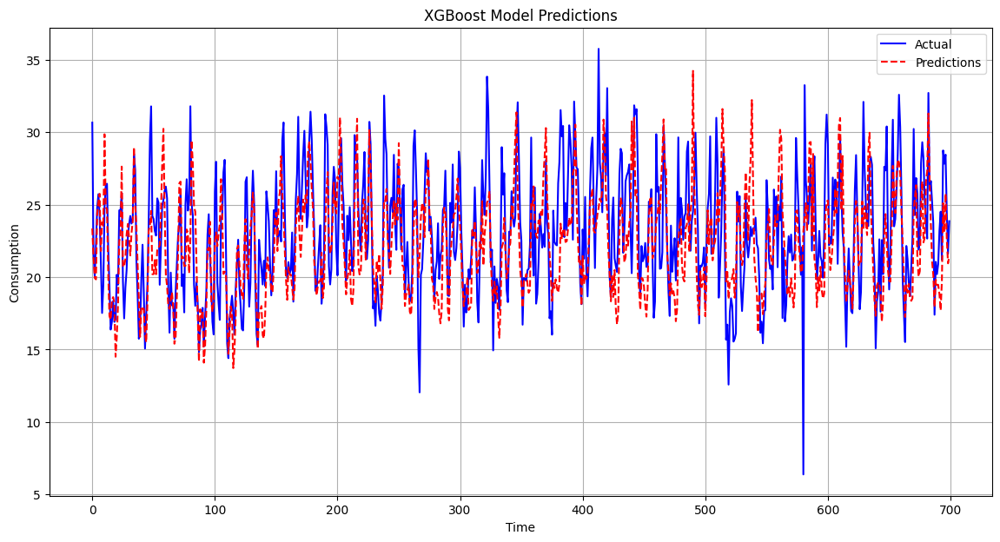

In [ ]:
# low lets do XGboost

!pip install xgboost
import xgboost as xgb

# Create an XGBoost regressor model
model_xgb = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=6)

# Train the model
model_xgb.fit(X_train, y_train, eval_set=[(X_test, y_test)], early_stopping_rounds=10, verbose=True)

# Make predictions
y_pred_xgb = model_xgb.predict(X_test)

# Plot the predictions
plot_predictions(df.index[train_size:],y_test, y_pred_xgb, 'XGBoost Model Predictions')


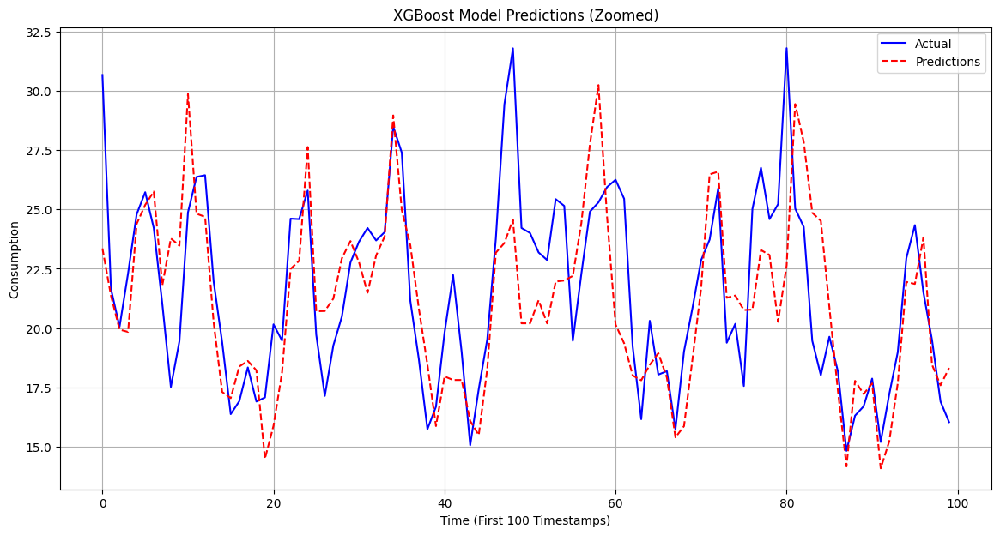

In [ ]:


# Plotting for XGBoost (zoomed in)
plot_predictions(df.index[train_size:train_size+100],y_test[:100], y_pred_xgb[:100], 'XGBoost Model Predictions (Zoomed)', xlabel='Time (First 100 Timestamps)')


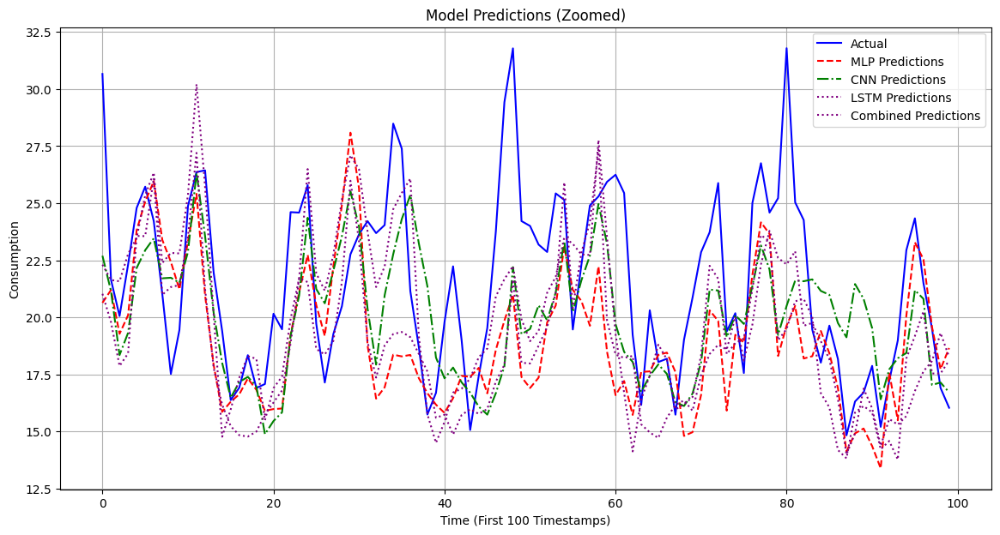

In [ ]:

# Plotting all model predictions (zoomed in) on the same plot
plt.figure(figsize=(14, 7))
plt.plot(y_test[:100], label='Actual', color='blue')
plt.plot(mlp_predictions[:100], label='MLP Predictions', color='red', linestyle='dashed')#MLP predictions
plt.plot(cnn_predictions[:100], label='CNN Predictions', color='green', linestyle='dashdot')#CNN predictions
plt.plot(lstm_predictions[:100], label='LSTM Predictions', color='purple', linestyle='dotted')  # LSTM predictions
plt.plot(combined_predictions[:100], label='Combined Predictions', color='purple', linestyle='dotted')#Hybrid model predictions
#plt.plot(y_pred_cb[:100], label='CatBoost Predictions', color='orange')#catboost predictions
#plt.plot(y_pred_xgb[:100], label='XGBoost Predictions', color='cyan')#XGboos predictions
plt.title('Model Predictions (Zoomed)')
plt.xlabel('Time (First 100 Timestamps)')
plt.ylabel('Consumption')
plt.legend()
plt.grid(True)
plt.show()



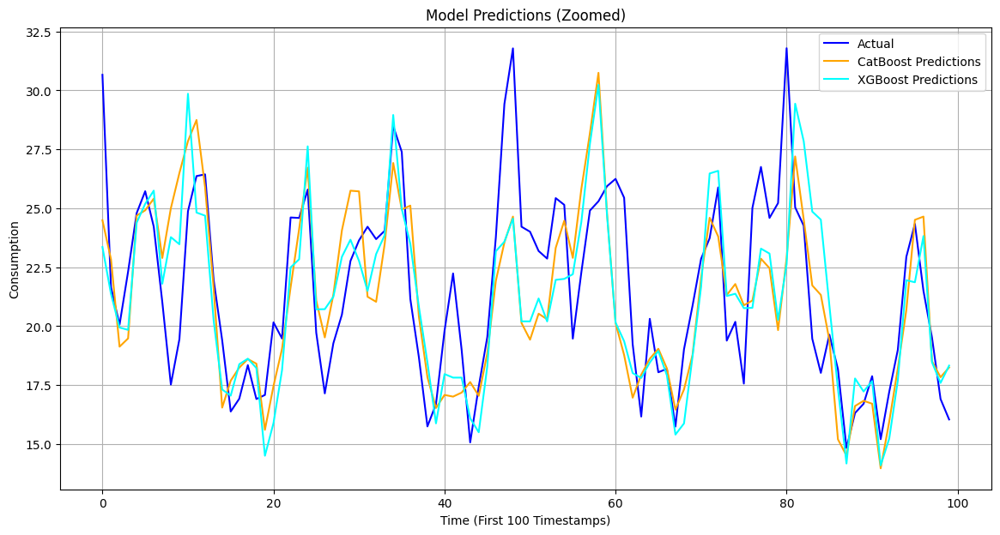

In [ ]:
plt.figure(figsize=(14, 7))
plt.plot(y_test[:100], label='Actual', color='blue')
plt.plot(y_pred_cb[:100], label='CatBoost Predictions', color='orange')#catboost predictions
plt.plot(y_pred_xgb[:100], label='XGBoost Predictions', color='cyan')#XGboos predictions
plt.title('Model Predictions (Zoomed)')
plt.xlabel('Time (First 100 Timestamps)')
plt.ylabel('Consumption')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
#calculate MAE, MSE, RMSE, MAPE errors for all my models

import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# LSTM Model
lstm_mae = mean_absolute_error(y_test, lstm_predictions)
lstm_mse = mean_squared_error(y_test, lstm_predictions)
lstm_rmse = np.sqrt(lstm_mse)
lstm_mape = mean_absolute_percentage_error(y_test, lstm_predictions)


# MLP Model
mlp_mae = mean_absolute_error(y_test, mlp_predictions)
mlp_mse = mean_squared_error(y_test, mlp_predictions)
mlp_rmse = np.sqrt(mlp_mse)
mlp_mape = mean_absolute_percentage_error(y_test, mlp_predictions)

# CNN Model
cnn_mae = mean_absolute_error(y_test, cnn_predictions)
cnn_mse = mean_squared_error(y_test, cnn_predictions)
cnn_rmse = np.sqrt(cnn_mse)
cnn_mape = mean_absolute_percentage_error(y_test, cnn_predictions)

# Combined CNN + LSTM Model
combined_mae = mean_absolute_error(y_test, combined_predictions)
combined_mse = mean_squared_error(y_test, combined_predictions)
combined_rmse = np.sqrt(combined_mse)
combined_mape = mean_absolute_percentage_error(y_test, combined_predictions)

# CatBoost Model
cb_mae = mean_absolute_error(y_test, y_pred_cb)
cb_mse = mean_squared_error(y_test, y_pred_cb)
cb_rmse = np.sqrt(cb_mse)
cb_mape = mean_absolute_percentage_error(y_test, y_pred_cb)

#XGboost model
xgb_mae= mean_absolute_error(y_test, y_pred_xgb)
xgb_mse = mean_squared_error(y_test, y_pred_xgb)
xgb_rmse = np.sqrt(xgb_mse)
xgb_mape = mean_absolute_percentage_error(y_test, y_pred_xgb)



# Create a dictionary to store the error values
error_values = {
    'Model': ['LSTM', 'MLP', 'CNN', 'Combined CNN + LSTM', 'CatBoost', 'XGBoost'],
    'MAE': [lstm_mae, mlp_mae, cnn_mae, combined_mae, cb_mae, xgb_mae],
    'MSE': [lstm_mse, mlp_mse, cnn_mse, combined_mse, cb_mse, xgb_mse],
    'RMSE': [lstm_rmse, mlp_rmse, cnn_rmse, combined_rmse, cb_rmse, xgb_rmse],
    'MAPE': [lstm_mape, mlp_mape, cnn_mape, combined_mape, cb_mape, xgb_mape]
}

# Create a Pandas DataFrame from the dictionary
error_df = pd.DataFrame(error_values)

# Display the DataFrame as a table
print(error_df.to_string(index=False))


              Model      MAE       MSE     RMSE     MAPE
               LSTM 3.168461 15.557784 3.944336 0.136903
                MLP 3.025443 14.665603 3.829570 0.131524
                CNN 2.940508 13.825236 3.718230 0.129183
Combined CNN + LSTM 3.364790 18.592887 4.311947 0.143634
           CatBoost 2.535129 10.647690 3.263080 0.113414
            XGBoost 2.683507 11.310442 3.363100 0.118307


In [ ]:

import numpy as np
# Calculate Percentage of Critical Events for 5% Error Margin
threshold = 0.05  # 5% error margin

# Calculate critical events for each model
lstm_critical_events = np.sum(np.abs((y_test - lstm_predictions.flatten()) / y_test) > threshold)
lstm_critical_percentage = (lstm_critical_events / len(y_test)) * 100


mlp_critical_events = np.sum(np.abs((y_test - mlp_predictions) / y_test) > threshold)
mlp_critical_percentage = (mlp_critical_events / len(y_test)) * 100

cnn_critical_events = np.sum(np.abs((y_test - cnn_predictions) / y_test) > threshold)
cnn_critical_percentage = (cnn_critical_events / len(y_test)) * 100

combined_critical_events = np.sum(np.abs((y_test - combined_predictions) / y_test) > threshold)
combined_critical_percentage = (combined_critical_events / len(y_test)) * 100

cb_critical_events = np.sum(np.abs((y_test - y_pred_cb) / y_test) > threshold)
cb_critical_percentage = (cb_critical_events / len(y_test)) * 100

xgb_critical_events = np.sum(np.abs((y_test - y_pred_xgb) / y_test) > threshold)
xgb_critical_percentage = (xgb_critical_events / len(y_test)) * 100

# create error DataFrame with critical event percentages
error_df_pce = pd.DataFrame({
    'Percentage of Critical Events': [
        lstm_critical_percentage, mlp_critical_percentage,
        cnn_critical_percentage, combined_critical_percentage, cb_critical_percentage,
        xgb_critical_percentage
    ]
}, index=['LSTM', 'MLP', 'CNN', 'Combined CNN + LSTM', 'CatBoost', 'XGBoost'])

# Display the updated DataFrame
print(error_df_pce.to_string(index=False))

#using the percentage of critical events for a 5% error margin as a performance metric.
# This metric provides a direct measure of how often the models exceed the acceptable error tolerance.
# A lower percentage indicates better performance as it means the model stays within the acceptable error range more frequently.


 Percentage of Critical Events
                     81.571429
                     77.857143
                     78.428571
                     80.285714
                     72.285714
                     77.571429


In [ ]:
#calculate PCE_MX for arima models
def calculate_pce_mx(y_true, y_pred, threshold):
    """Calculates the Percentage of Critical Events (PCE_MX) for a given threshold.

    Args:
        y_true: The true values.
        y_pred: The predicted values.
        threshold: The critical error threshold.

    Returns:
        The PCE_MX value.
    """
    # Ensure y_pred is a numpy array
    y_pred = np.array(y_pred)

    # Debugging: print shapes and a few sample values
    print("y_true shape:", y_true.shape)
    print("y_pred shape:", y_pred.shape)
    print("First 5 y_true values:", y_true[:5])
    print("First 5 y_pred values:", y_pred[:5])

    # Calculate critical events
    critical_events = np.sum(np.abs((y_true - y_pred) / y_true) > threshold)
    pce_mx = (critical_events / len(y_true)) * 100

    # Debugging: print intermediate values
    print("Number of critical events:", critical_events)
    print("Length of y_true:", len(y_true))
    return pce_mx


# Get predictions for each ARIMA model
ar1_predictions = exp_arima.predict_model(ar1, fh=400)
ma1_predictions = exp_arima.predict_model(ma1, fh=400)
arima111_predictions = exp_arima.predict_model(arima111, fh=400)
sarima212201_predictions = exp_arima.predict_model(sarima212201, fh=400)

# Extract actual values for the forecast horizon
y_test_arima = arima_df['consumption'].iloc[-400:].values  # Convert to numpy array

# Ensure predictions are also numpy arrays
ar1_predictions = ar1_predictions['y_pred'].values
ma1_predictions = ma1_predictions['y_pred'].values
arima111_predictions = arima111_predictions['y_pred'].values
sarima212201_predictions = sarima212201_predictions['y_pred'].values

# Check the shapes of y_test_arima and predictions
print("y_test_arima shape:", y_test_arima.shape)
print("ar1_predictions shape:", ar1_predictions.shape)
print("ma1_predictions shape:", ma1_predictions.shape)
print("arima111_predictions shape:", arima111_predictions.shape)
print("sarima212201_predictions shape:", sarima212201_predictions.shape)

# Calculate PCE_MX for each model
threshold = 0.05

ar1_pce_mx = calculate_pce_mx(y_test_arima, ar1_predictions, threshold)
ma1_pce_mx = calculate_pce_mx(y_test_arima, ma1_predictions, threshold)
arima111_pce_mx = calculate_pce_mx(y_test_arima, arima111_predictions, threshold)
sarima212201_pce_mx = calculate_pce_mx(y_test_arima, sarima212201_predictions, threshold)

# Create a DataFrame to store PCE_MX values
pce_df = pd.DataFrame({
    'Model': ['AR(1)', 'MA(1)', 'ARIMA(1,1,1)', 'SARIMA(2,1,2)(2,0,1,24)'],
    'PCE_MX (5%)': [ar1_pce_mx, ma1_pce_mx, arima111_pce_mx, sarima212201_pce_mx]
})

# Display the PCE_MX DataFrame
print(pce_df)




,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ARIMA,1.1204,0.8049,4.4919,5.3169,0.1856,0.2074,-0.6377


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ARIMA,0.8282,0.6306,3.3204,4.1654,0.1422,0.1480,-0.0052


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ARIMA,1.9647,1.3088,7.8764,8.6455,0.3708,0.2979,-3.3302


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ARIMA,0.6531,0.5056,2.6183,3.3400,0.1152,0.1140,0.3537


y_test_arima shape: (400,)
ar1_predictions shape: (400,)
ma1_predictions shape: (400,)
arima111_predictions shape: (400,)
sarima212201_predictions shape: (400,)
y_true shape: (400,)
y_pred shape: (400,)
First 5 y_true values: [27.54273111 23.14573556 20.51075333 16.58346889 19.48034222]
First 5 y_pred values: [24.3789 20.84   20.0249 16.9366 21.2505]
Number of critical events: 362
Length of y_true: 400
y_true shape: (400,)
y_pred shape: (400,)
First 5 y_true values: [27.54273111 23.14573556 20.51075333 16.58346889 19.48034222]
First 5 y_pred values: [26.3104 21.4669 21.2917 17.0963 22.1169]
Number of critical events: 312
Length of y_true: 400
y_true shape: (400,)
y_pred shape: (400,)
First 5 y_true values: [27.54273111 23.14573556 20.51075333 16.58346889 19.48034222]
First 5 y_pred values: [28.4812 25.9764 26.7053 26.1126 29.9289]
Number of critical events: 378
Length of y_true: 400
y_true shape: (400,)
y_pred shape: (400,)
First 5 y_true values: [27.54273111 23.14573556 20.51075333 16

In [ ]:

# Calculate PCE_MX for ARIMAX model
arimax_pce_mx = calculate_pce_mx(y_test_arima, predictions, threshold)

# Add ARIMAX to the PCE_MX DataFrame
pce_df.loc[len(pce_df.index)] = ['ARIMAX(1,1,1)', arimax_pce_mx]

# Display the updated PCE_MX DataFrame
print(pce_df)


y_true shape: (400,)
y_pred shape: (400,)
First 5 y_true values: [27.54273111 23.14573556 20.51075333 16.58346889 19.48034222]
First 5 y_pred values: [25.22771336 22.6013161  20.66531845 19.75208332 21.92261255]
Number of critical events: 284
Length of y_true: 400
                     Model  PCE_MX (5%)
0                    AR(1)        90.50
1                    MA(1)        78.00
2             ARIMA(1,1,1)        94.50
3  SARIMA(2,1,2)(2,0,1,24)        72.25
4            ARIMAX(1,1,1)        71.00
